In [43]:
import torch
#from albumentations.pytorch import ToTensorV2
#from tqdm import tqdm
import torch.nn as nn 
%run loss.ipynb
%run dataset.ipynb
%run ThreeDUNET.ipynb
import os
from glob import glob
import matplotlib.pyplot as plt


cuda
device name NVIDIA RTX A5000


In [44]:
def voltosl(vol,sliceno):
    #Volume is shape [1,3,112,112,112]
    #Need to plot each slice at sliceno
    #print(vol.shape)
    print(vol.shape)
    vol = vol[0,:,:,:,:]
    #print("after argmax:", vol.shape)
    vol = vol[:,:,:,sliceno].cpu()
    # vol=torch.argmax(vol,0)
    # print(vol)
    slice = np.asarray(vol.detach().numpy())
    slice = slice.reshape([112,112])
    #print(slice.shape)
    return slice

In [45]:
def voltoslmask(vol,sliceno):
    #Volume is shape [1,3,112,112,112]
    #Need to plot each slice at sliceno
    #print(vol.shape)
    print(vol.shape)
    vol = vol[0,:,:,:,:]
    #print("after argmax:", vol.shape)
    vol = vol[:,:,:,sliceno].cpu()
    vol=torch.argmax(vol,0)
    # print(vol)
    slice = np.asarray(vol.detach().numpy())
    slice = slice.reshape([112,112])
    #print(slice.shape)
    return slice

In [46]:
device = torch.device('cuda')
model= UNET(in_channels = 1, out_channels = 3, features = [16,32,64,128])

In [47]:
rootfile = "/home/yiho/Haziq/3D 112 Dataset"
TEST_IMG_DIR = os.path.join(rootfile, "test/image/*")
TEST_MASK_DIR = os.path.join(rootfile, "test/mask/*")
BATCH_SIZE = 1

In [48]:
test_x = sorted(glob(TEST_IMG_DIR))
test_y = sorted(glob(TEST_MASK_DIR))
testcases = []
for i in range(0, len(test_x)):
    #print(train_x)
    head,casename = os.path.split(test_x[i])
    testcases += [casename]

print(testcases)

test_x = []
test_y = []
for cases in testcases:
    test_x_dir = os.path.join(TEST_IMG_DIR[:-1], cases)
    test_y_dir = os.path.join(TEST_MASK_DIR[:-1], cases)

    test_x += sorted(glob(test_x_dir + "/*"))
    test_y += sorted(glob(test_y_dir + "/*"))


print("Test Img Dir: ", TEST_IMG_DIR)

print(test_y)
print(np.shape(test_y))

test_dataset = NiftiDataset(test_x,test_y)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 0)

['Case119_post_LV', 'Case_122_Pre', 'case107_pre_LV']
Test Img Dir:  /home/yiho/Haziq/3D 112 Dataset/test/image/*
['/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time001.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time002.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time003.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time004.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time005.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time006.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time007.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time008.nii', '/home/yiho/Haziq/3D 112 Dataset/test/mask/Case119_post_LV/Case119_post_LV_mask_time009.nii', '/home/yiho/Haziq/3D 112 Dataset/test/m

In [52]:
newpath = rootfile + "/testmodelsaves/HPCRunPlease/bestcheckpoint.pth"
#model = torch.load(modpath)

checkpoint = torch.load(newpath)
testmodel= UNET(in_channels = 1, out_channels = 3, features = [32, 64, 128])
testmodel = testmodel.to(device)
testmodel.load_state_dict(checkpoint)

<All keys matched successfully>

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


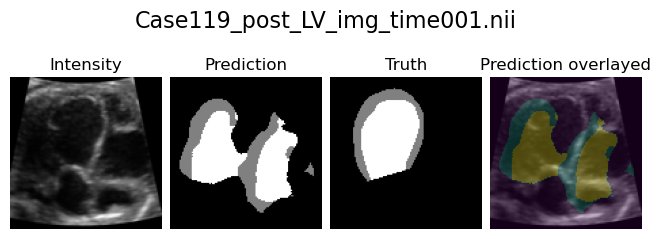

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


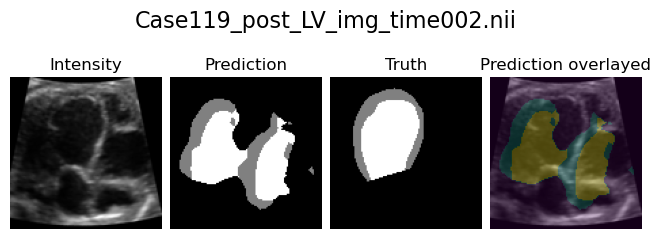

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


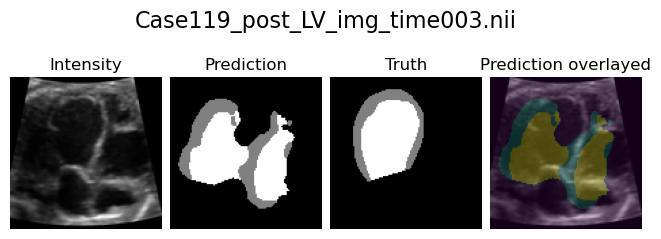

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


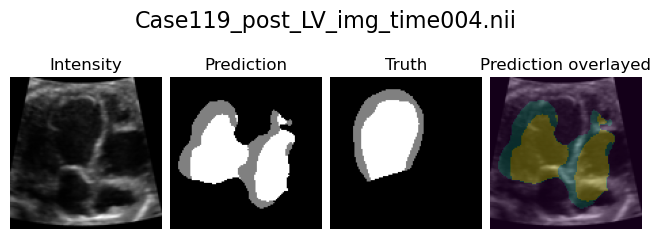

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


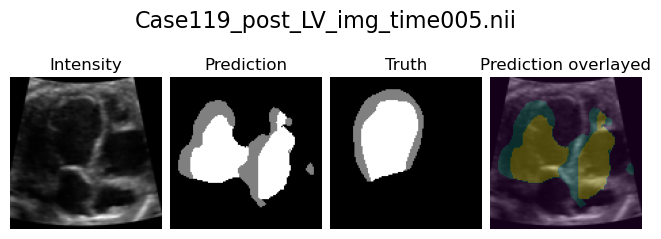

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


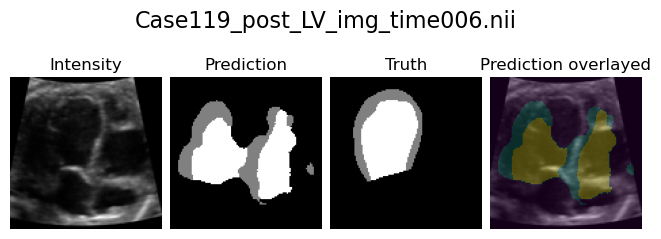

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


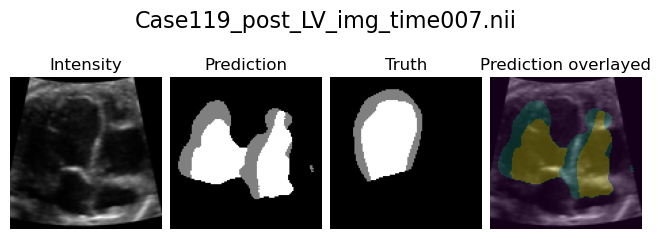

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


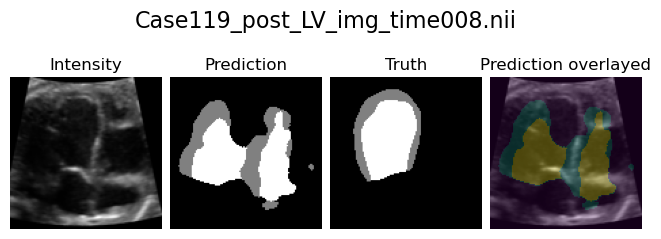

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


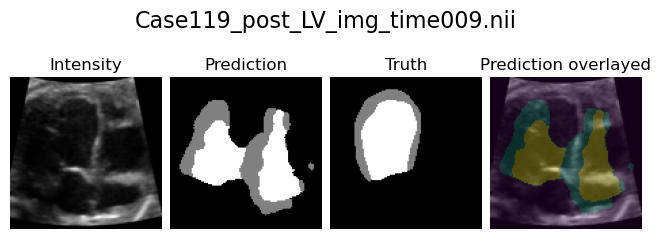

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


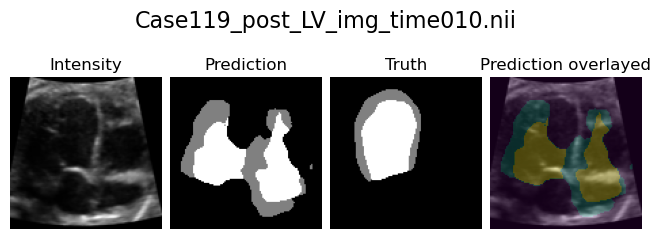

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


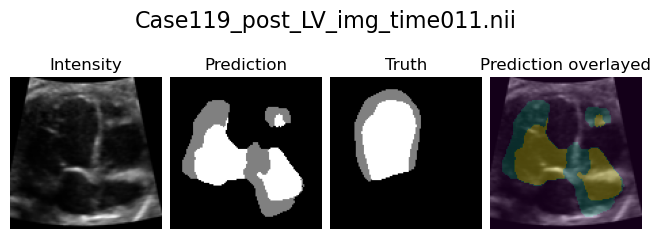

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


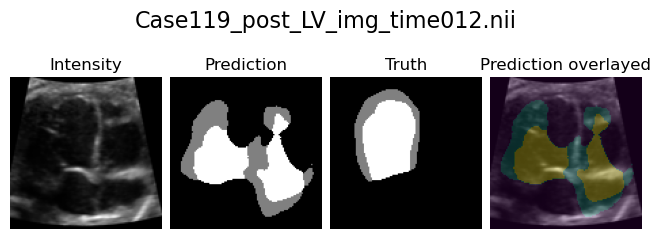

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


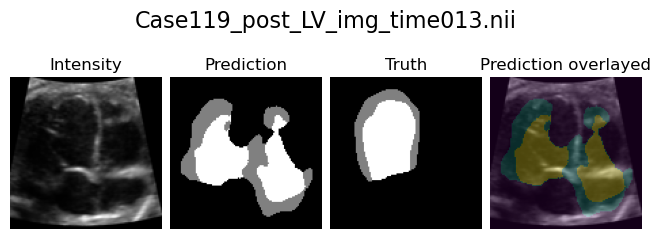

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


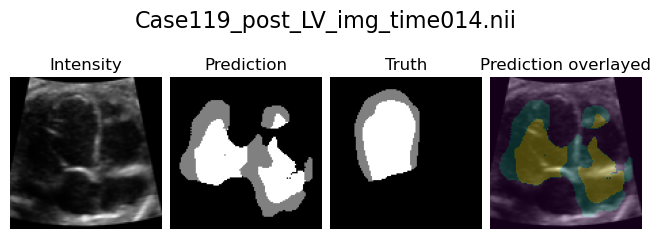

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


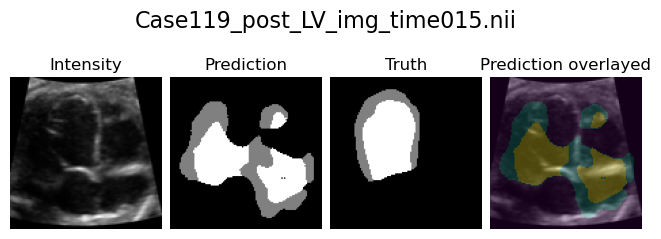

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


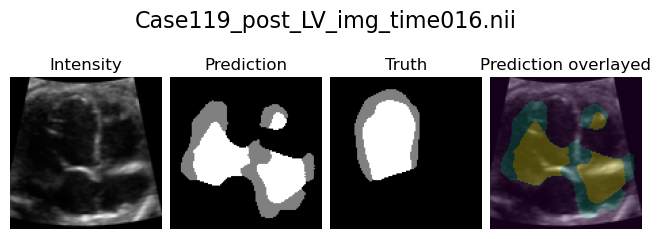

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


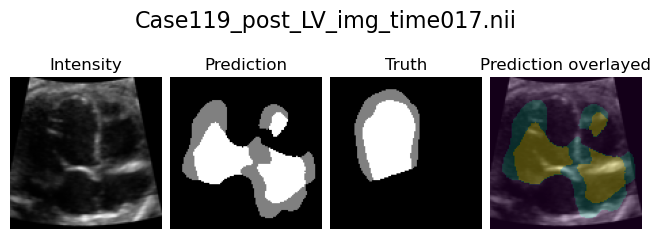

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


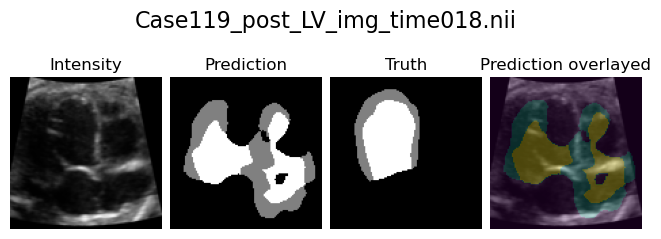

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


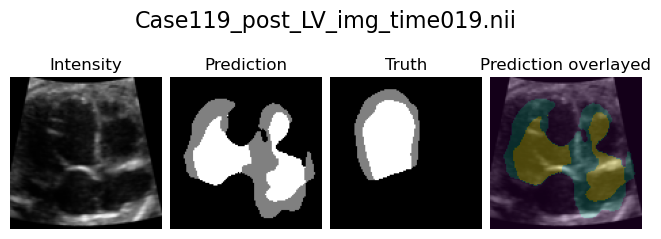

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


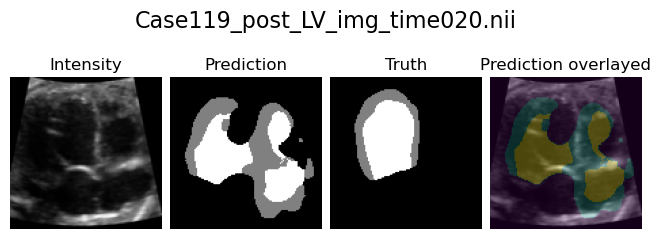

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


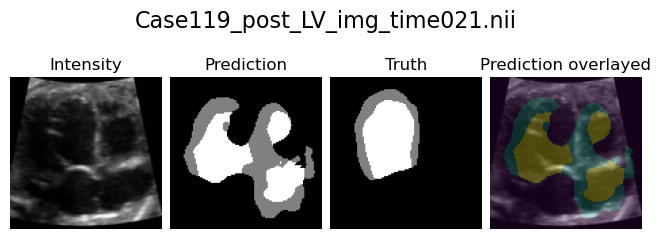

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


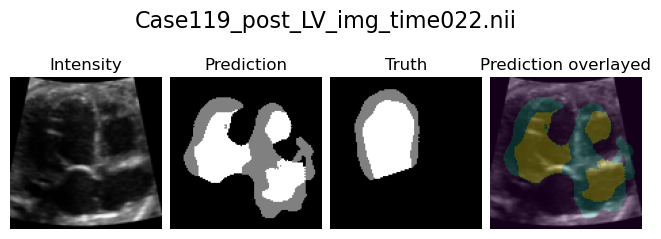

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


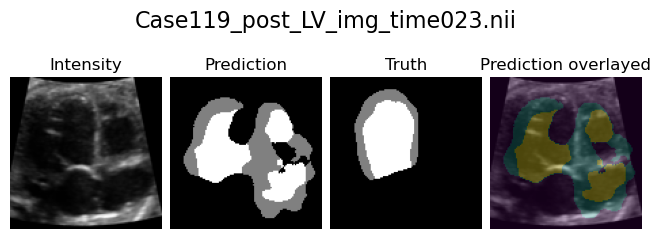

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


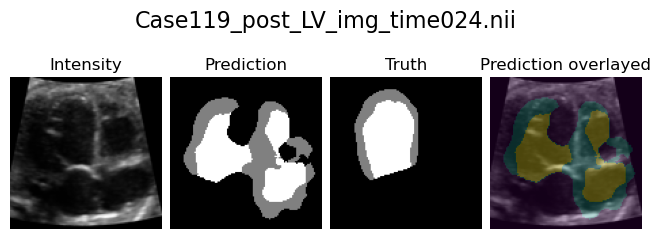

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


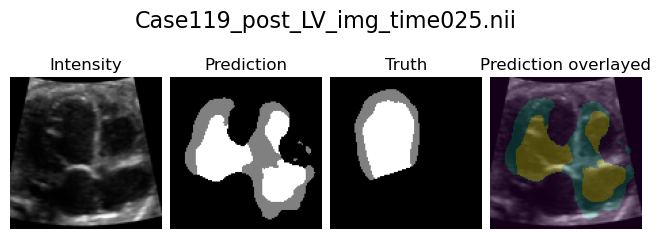

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


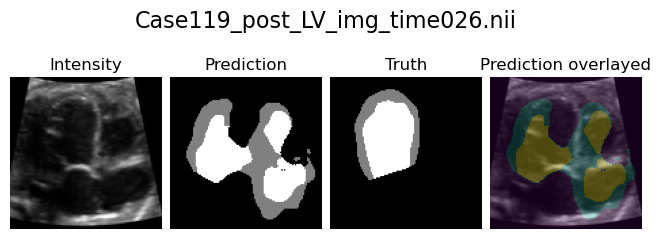

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


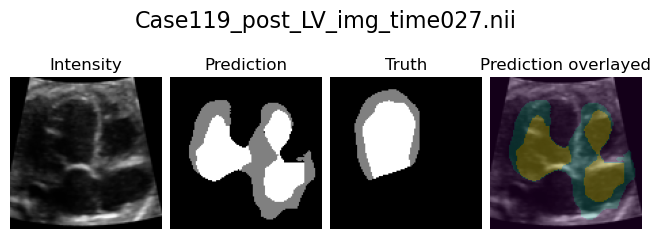

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


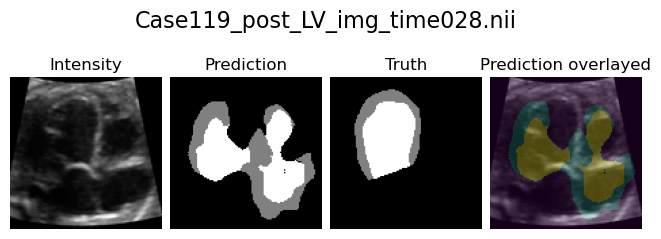

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


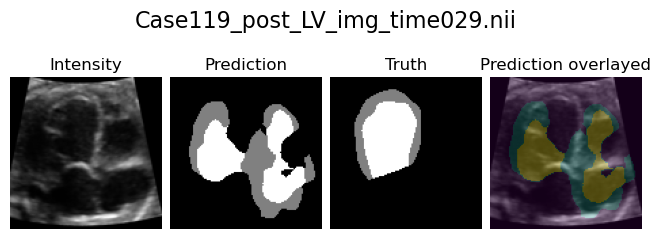

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


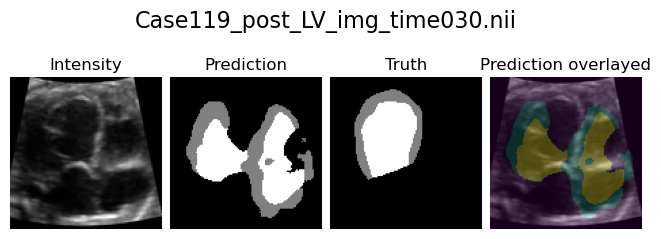

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


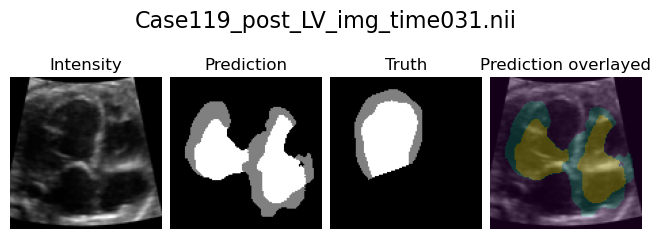

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


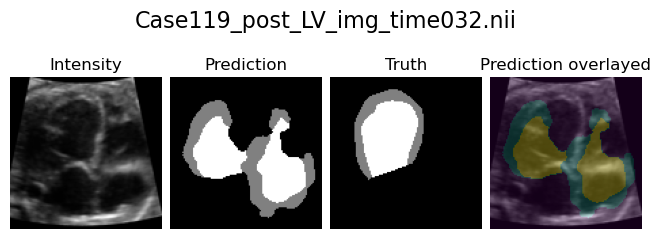

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


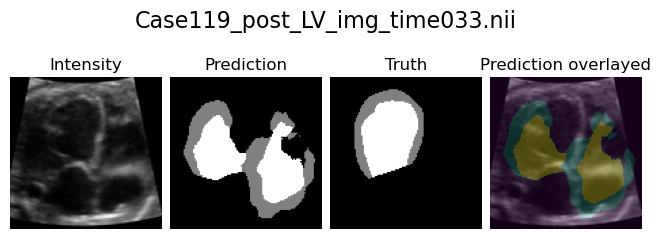

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


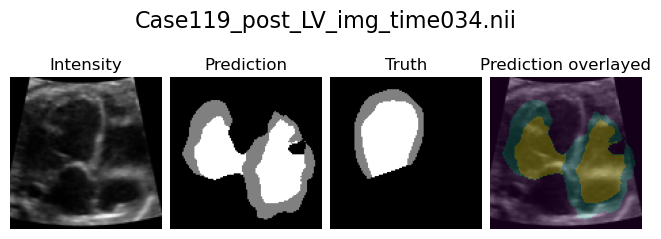

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


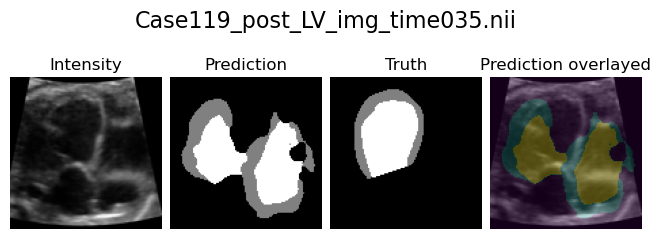

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


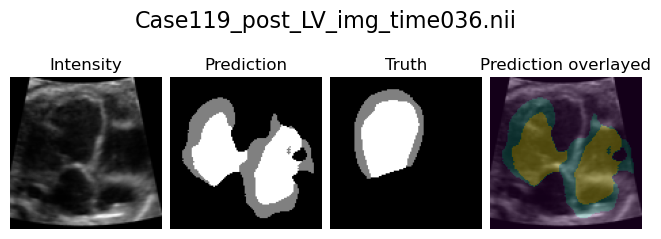

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


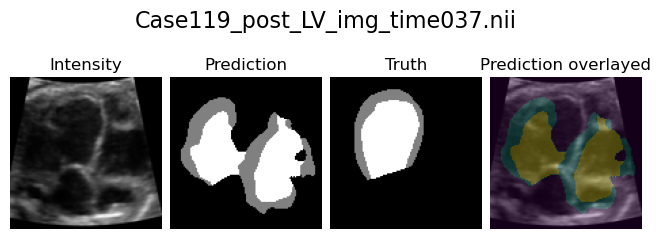

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


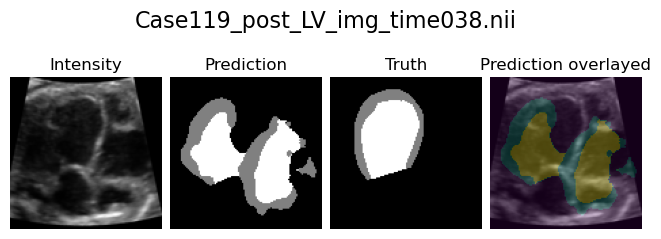

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


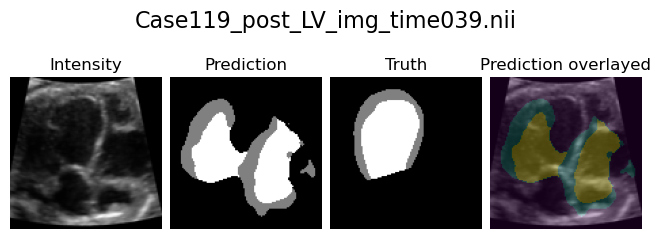

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


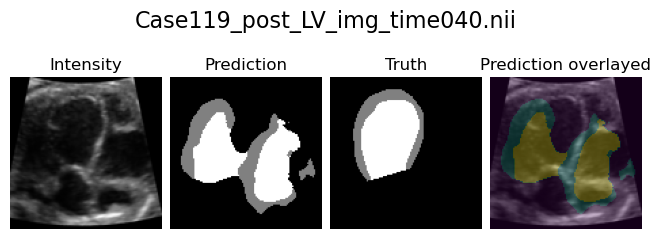

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


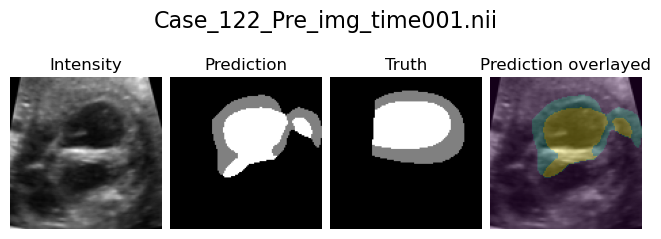

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


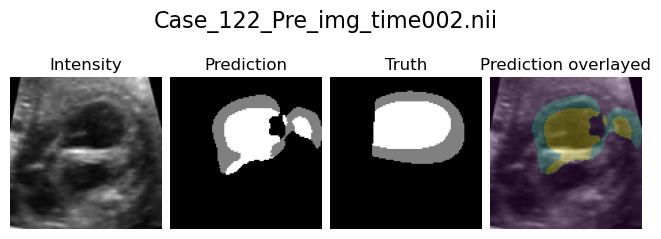

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


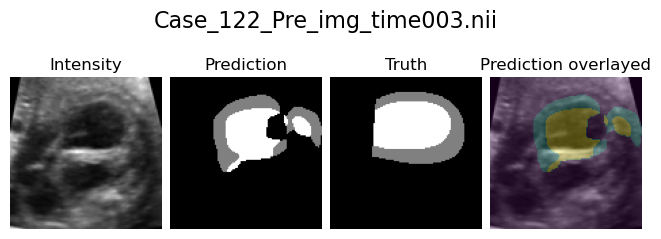

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


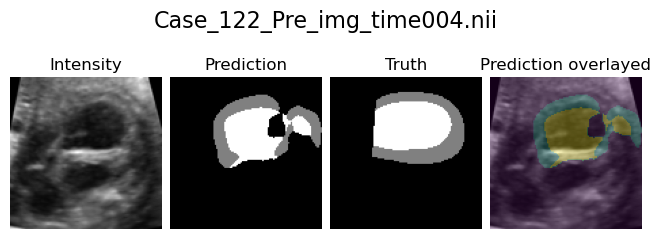

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


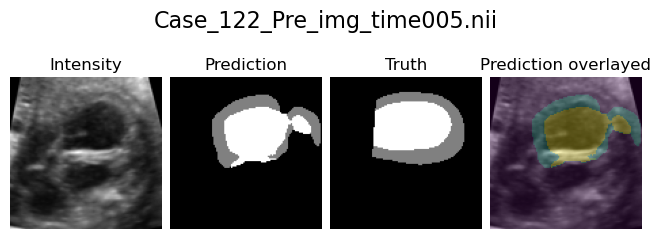

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


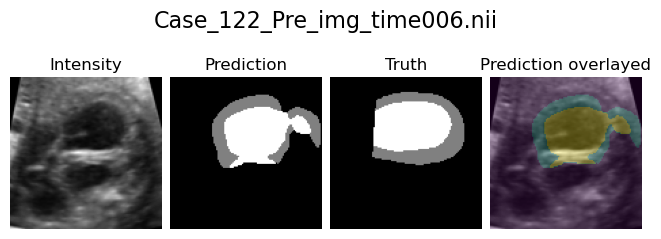

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


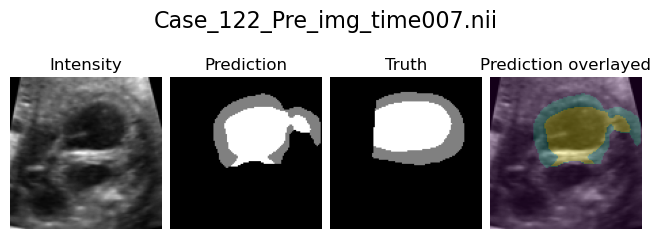

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


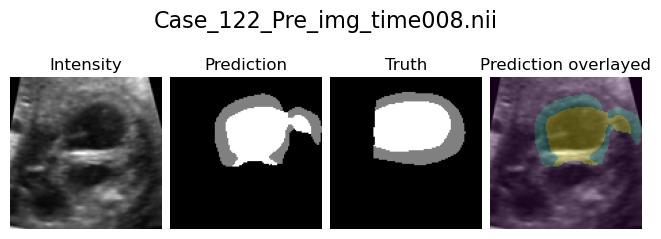

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


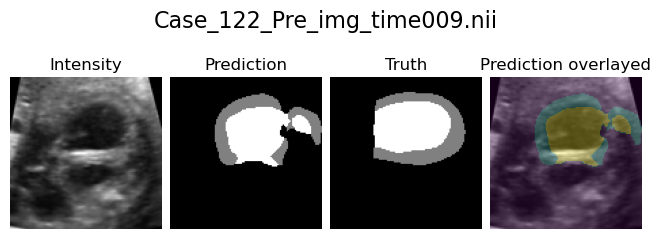

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


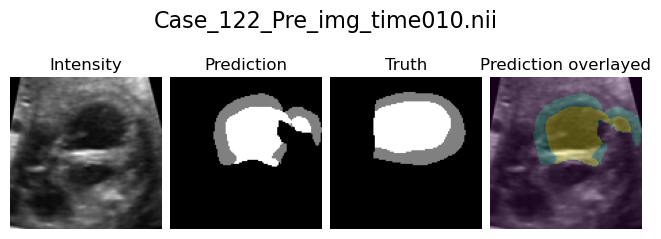

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


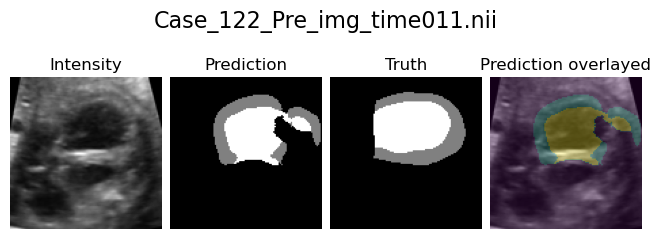

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


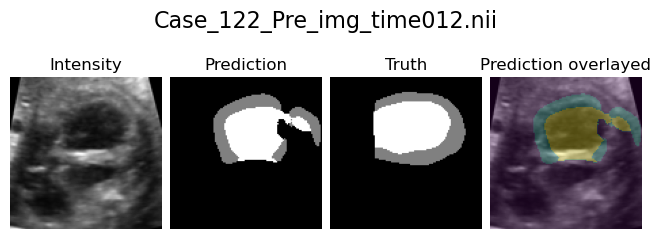

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


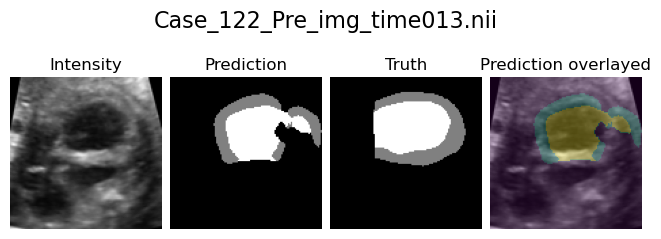

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


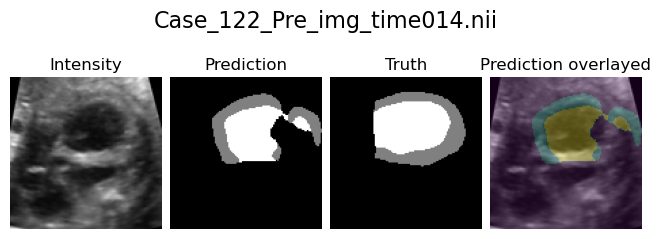

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


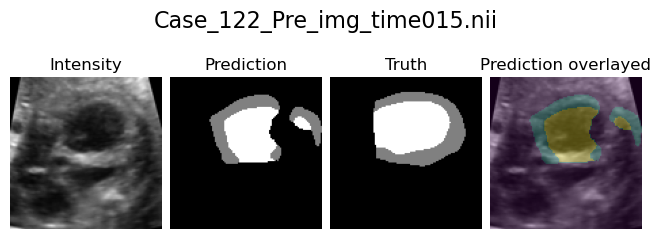

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


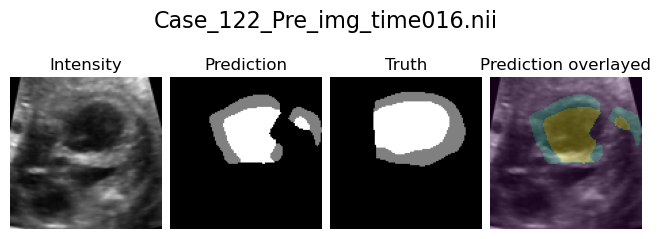

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


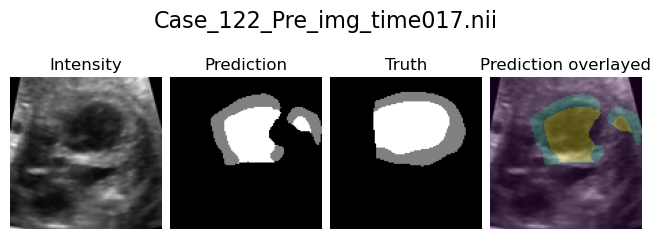

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


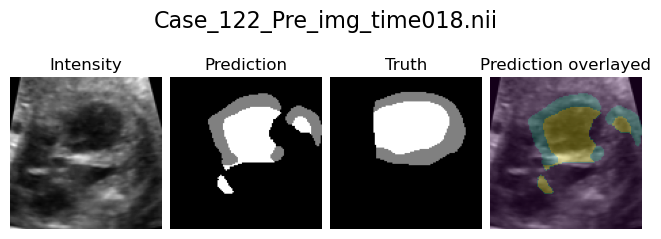

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


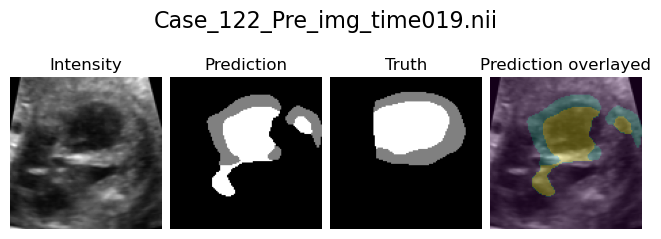

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


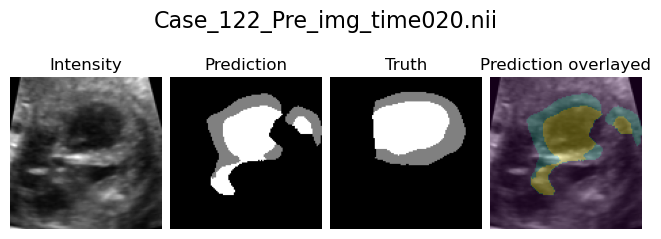

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


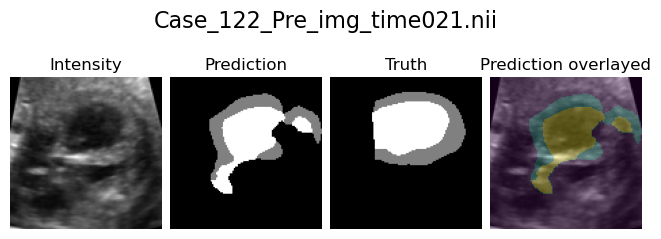

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


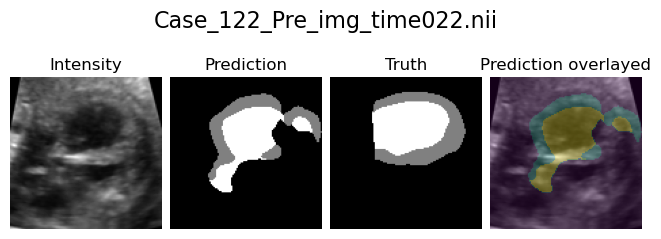

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


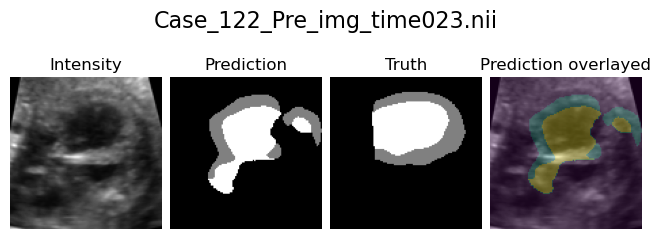

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


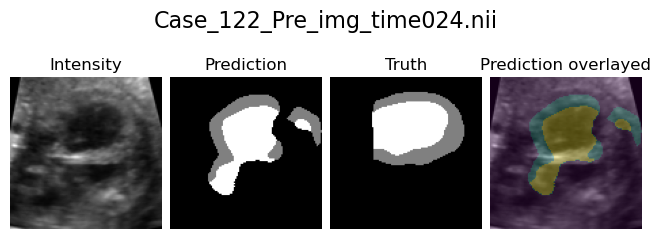

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


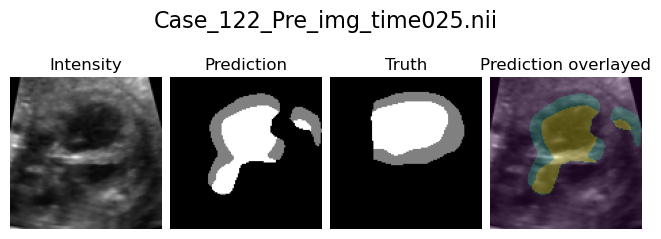

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


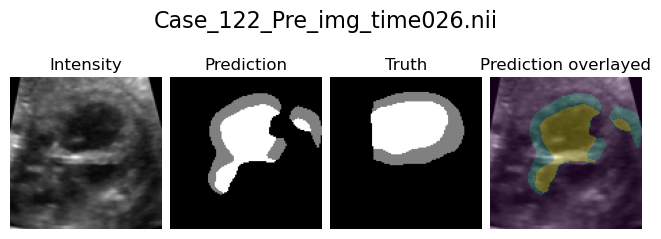

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


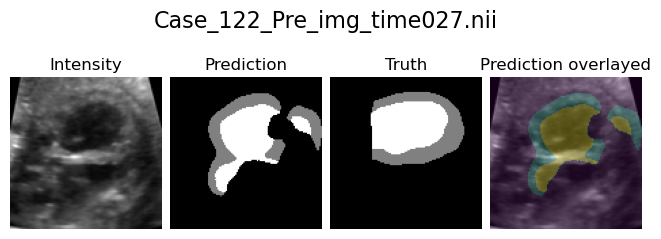

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


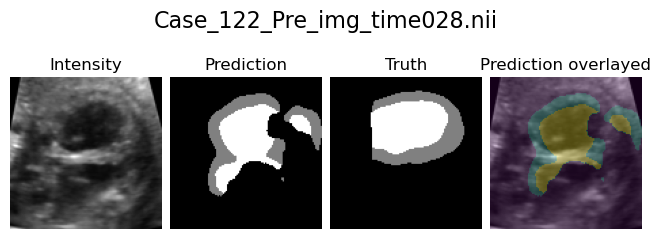

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


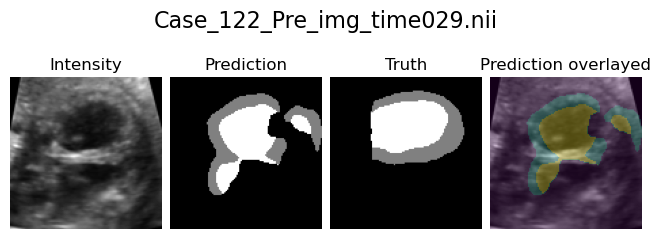

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


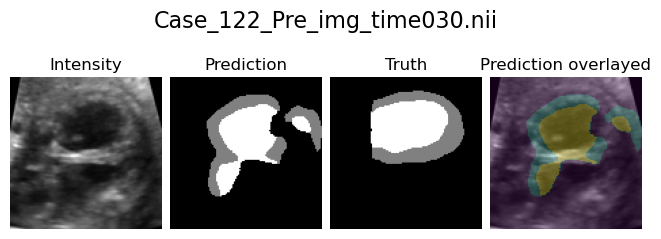

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


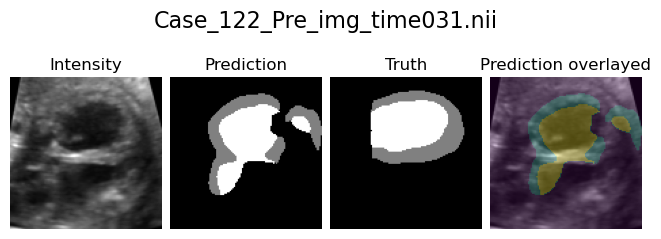

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


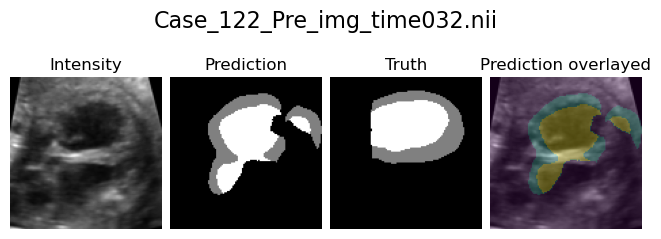

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


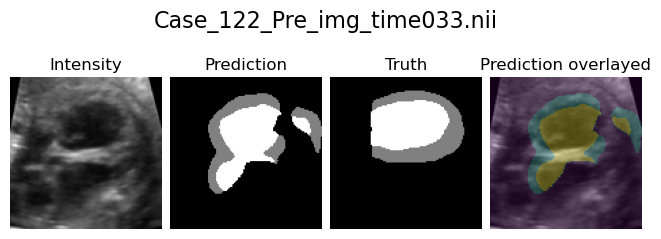

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


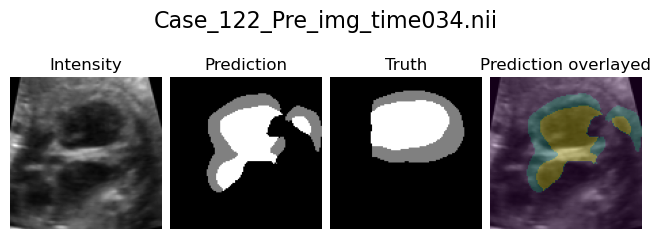

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


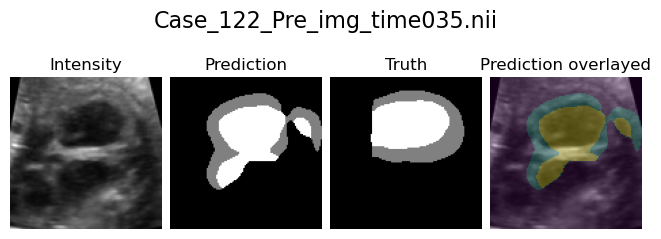

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


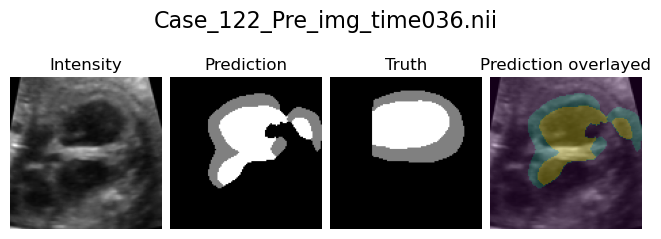

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


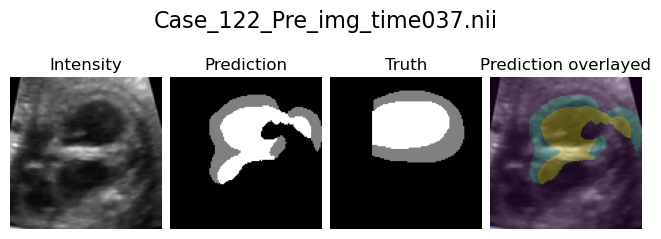

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


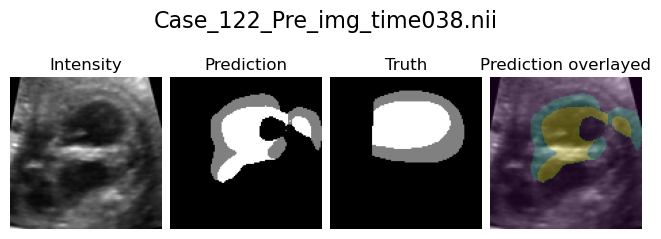

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


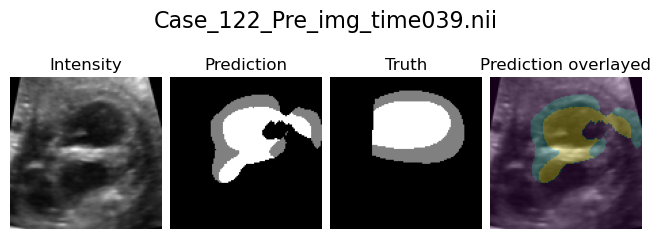

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


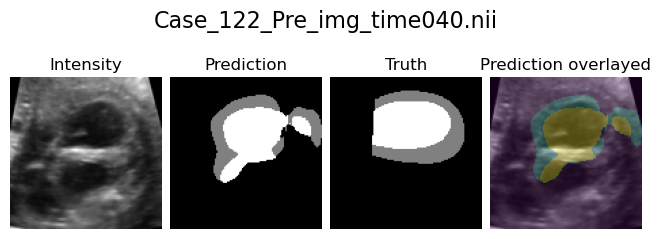

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


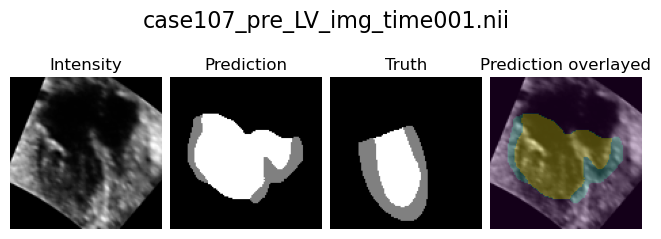

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


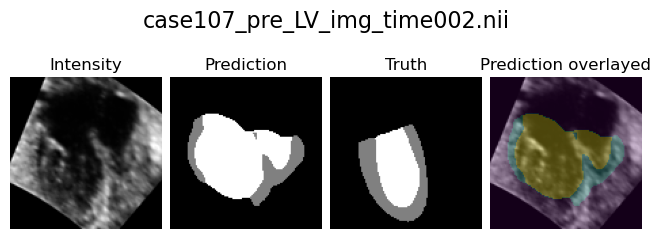

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


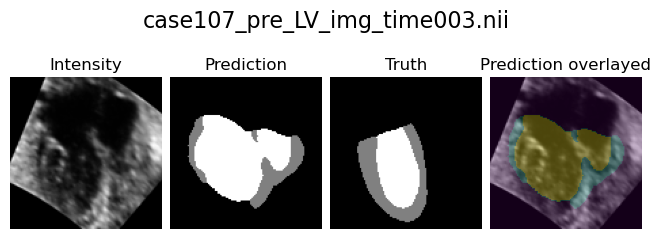

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


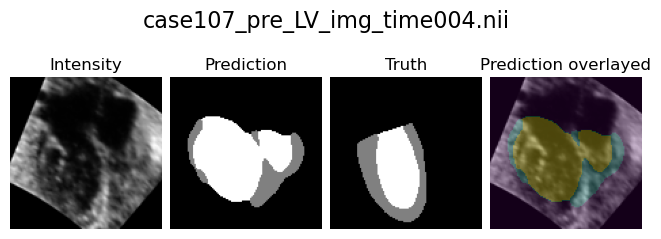

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


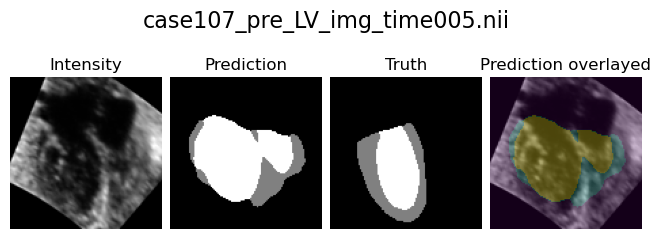

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


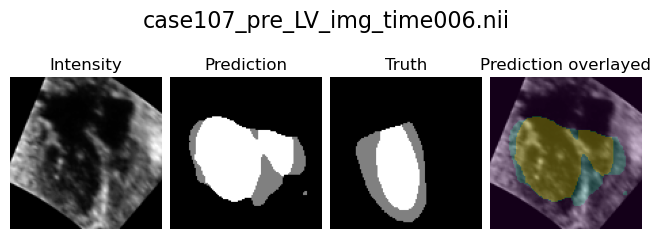

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


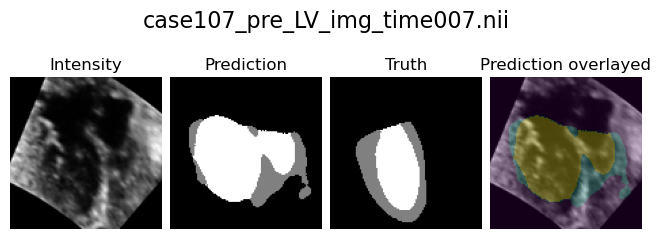

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


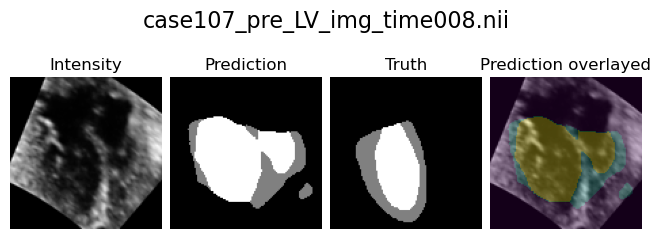

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


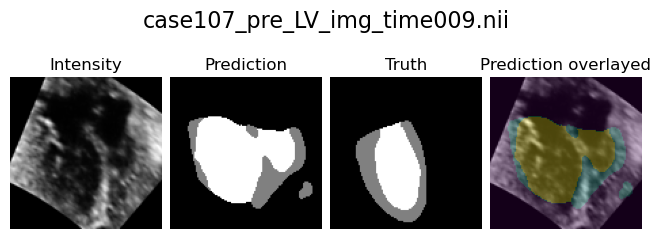

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


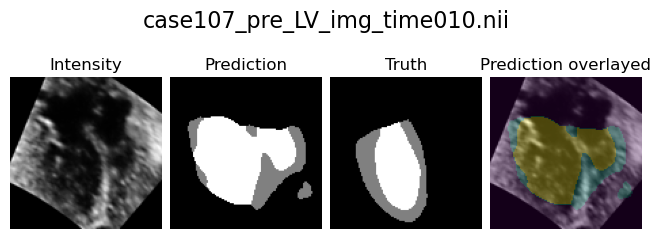

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


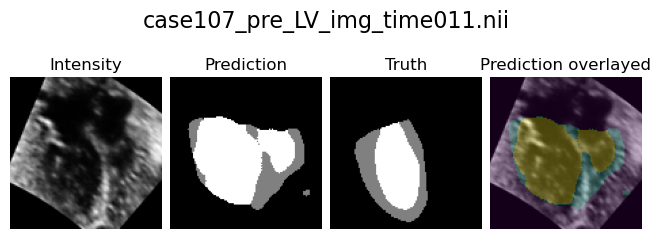

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


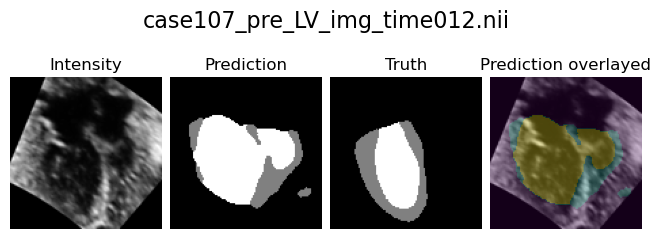

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


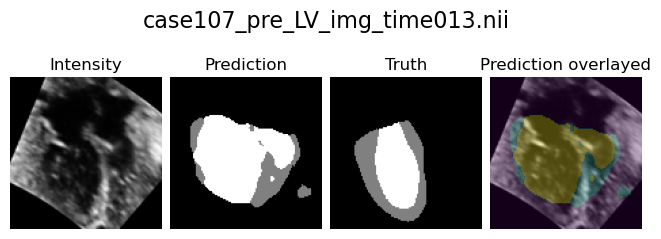

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


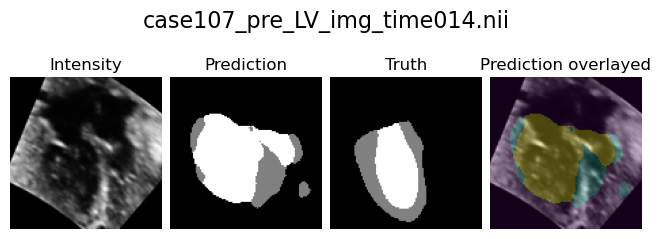

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


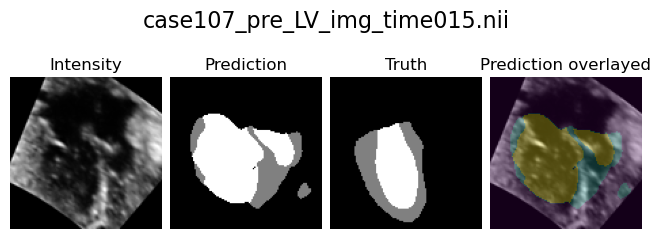

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


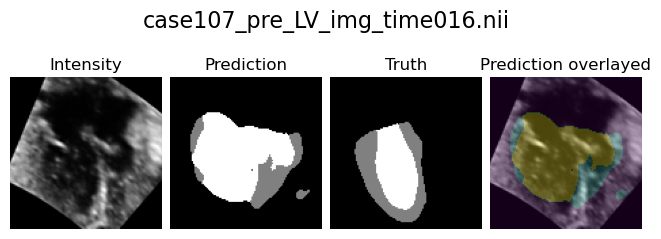

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


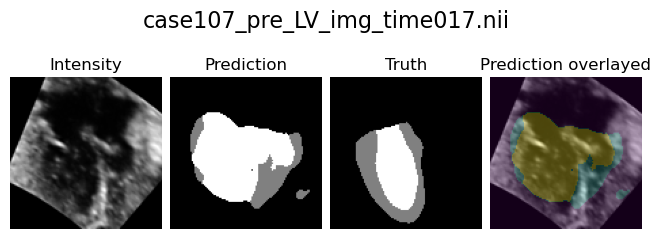

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


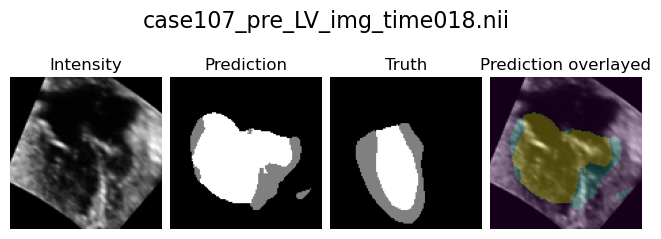

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


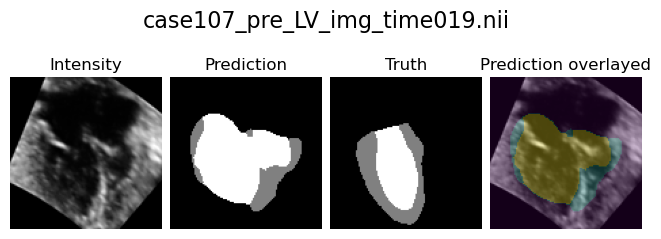

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


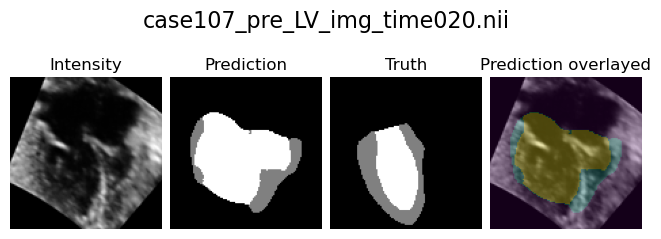

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


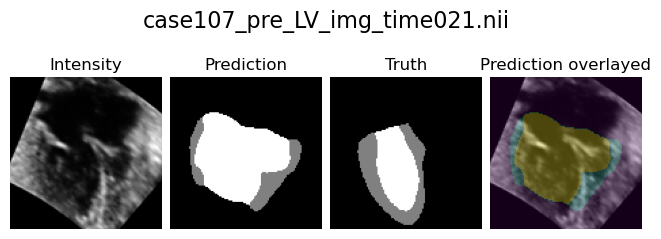

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


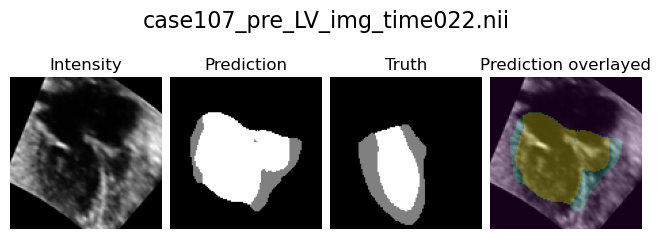

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


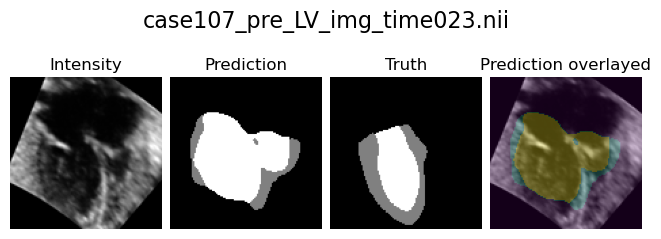

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


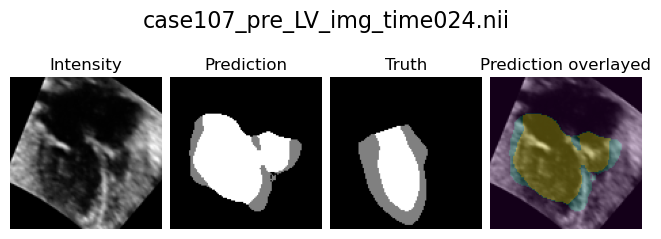

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


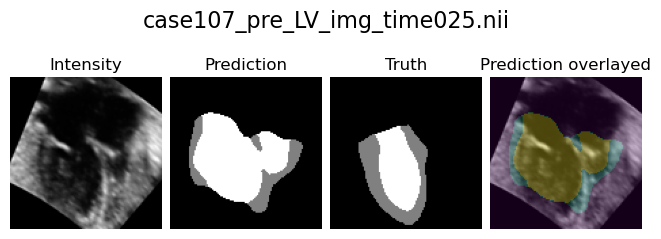

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


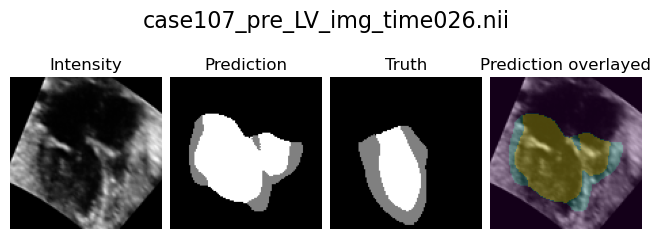

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


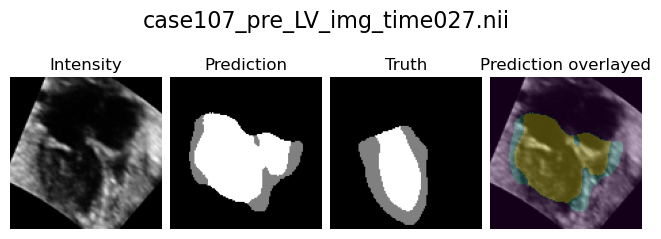

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


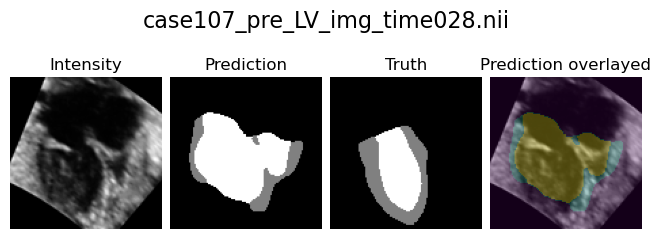

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


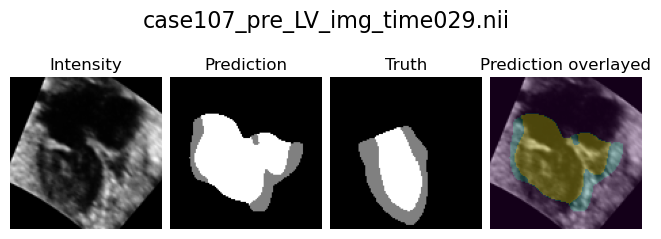

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


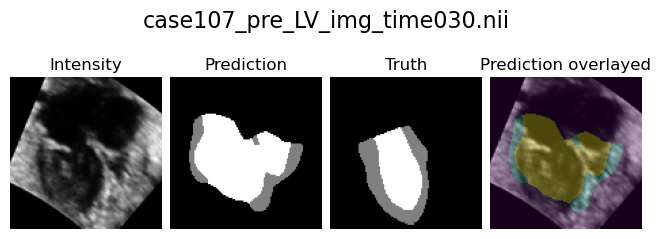

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


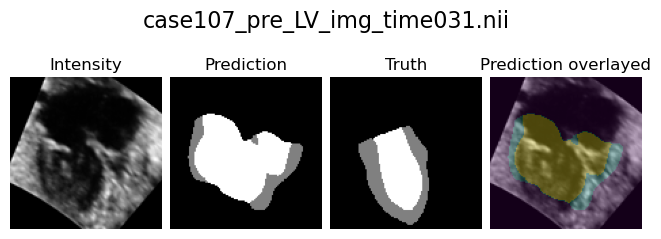

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


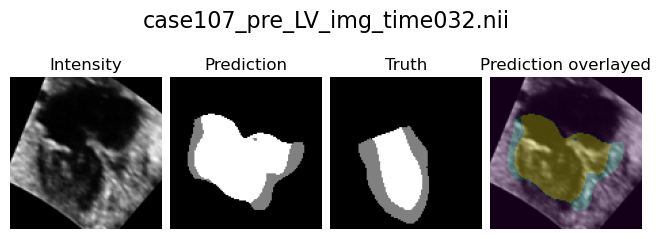

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


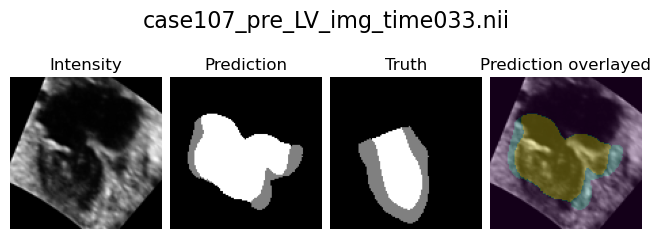

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


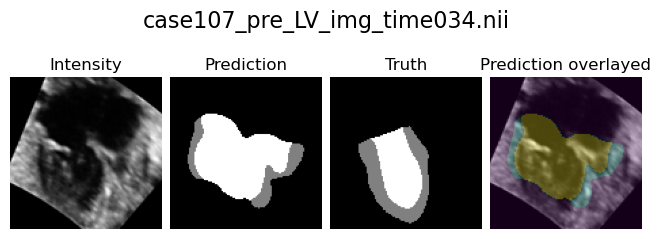

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


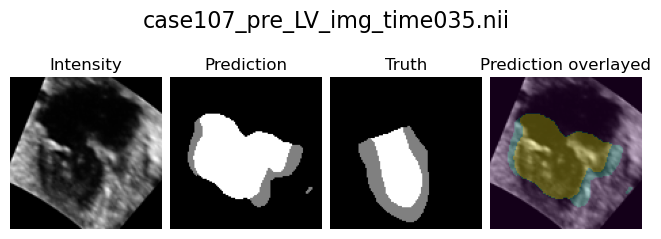

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


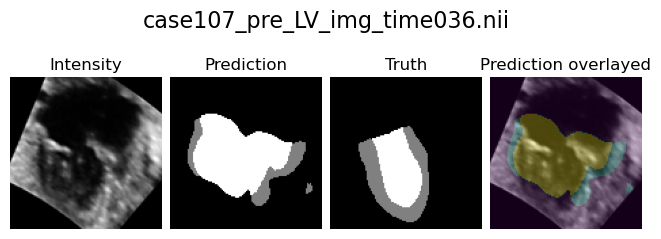

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


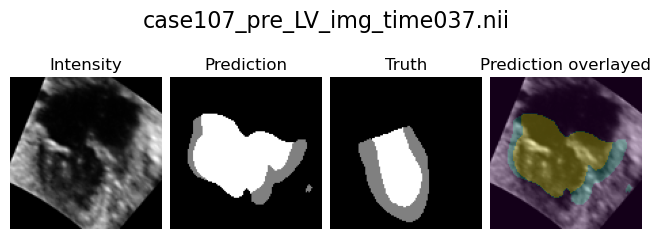

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


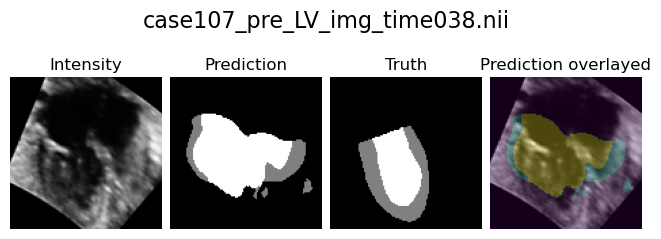

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


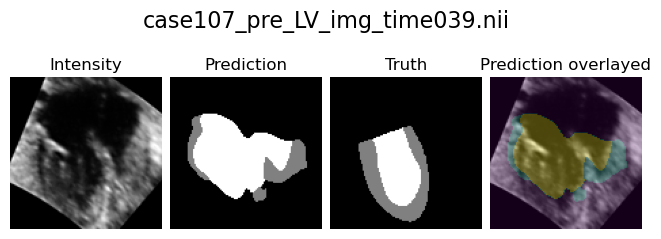

torch.Size([1, 3, 112, 112, 112])
torch.Size([1, 1, 112, 112, 112])


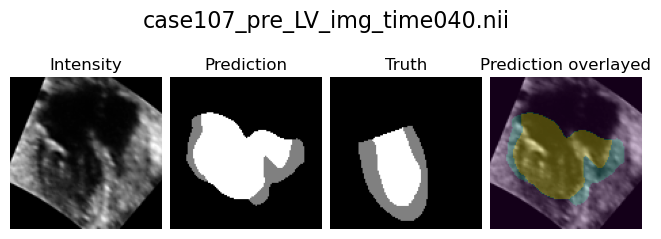

In [53]:

def test(model,loader, device):
    DICE = 0

    #model.load_state_dict(torch.load(model_path, map_location = device))
    #Have to specify what case we're on?
    model.eval()
    with torch.no_grad():
        for traindata in loader:
            x = traindata['train_img'].to(device, dtype=torch.float32)
            y = traindata['train_mask'].to(device, dtype=torch.float32)

            #print(traindata['name'])

            y_pred = model(x)
            dice = Dice()
            DICE += dice(y_pred,y).item()

            sliceno = 40      

            intensity = x[0,:,:,:,sliceno].cpu()
            slice = np.asarray(intensity.detach().numpy())
            slice = slice.reshape([112,112])
            intensity = slice
            
            pred = voltoslmask(y_pred,sliceno)
            truth = voltosl(y,sliceno)

            fig, ax = plt.subplots(1,4, layout = 'constrained')
            
            #os.path.basename(os.path.normpath(traindata['name'][0]))

            ax[0].imshow(intensity, cmap='gray')
            ax[0].set_title("Intensity")
            ax[0].axis("off")
            ax[1].imshow(pred, cmap='gray')
            ax[1].set_title("Prediction")  
            ax[1].axis("off")         
            ax[2].imshow(truth, cmap='gray')
            ax[2].set_title("Truth")
            ax[2].axis("off")
            ax[3].imshow(intensity, cmap="gray")
            ax[3].imshow(pred, alpha=0.3)
            ax[3].set_title("Prediction overlayed")
            ax[3].axis('off')
            fig.suptitle(os.path.basename(traindata["name"][0]), fontsize=16, y=0.8)
            #fig.subplots_adjust(top=0)  # Adjust the top spacing to reduce the gap
            plt.show()

    return DICE/len(loader)
test2path = "C:/Users/Haziq/OneDrive - Imperial College London/Third Year/Fetal VR Group Project/Files/3D 112 Dataset/testmodelsaves/1stModelTrain.pth"
DICE = test(testmodel,test_loader,device)
# dice2 = test(model,test_loader,device)

In [ ]:
print(DICE)

0.3432996477931738
